# Importing Packages and Install

In [19]:
!pip install Interpret

In [23]:
!pip install imodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.1/243.1 kB 5.3 MB/s eta 0:00:00


In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
import shap
from itertools import combinations

from interpret import show
from interpret.glassbox import ExplainableBoostingClassifier

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTENC

from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    StratifiedKFold,
    GridSearchCV,
    HalvingRandomSearchCV
)
from sklearn.utils import class_weight
from sklearn.metrics import (
    roc_auc_score,
    recall_score,
    confusion_matrix,
    classification_report,
    fbeta_score,
    make_scorer
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from lightgbm import LGBMClassifier

from statsmodels.stats.outliers_influence import variance_inflation_factor


# Data Import and Loading

In [5]:
import pandas as pd

# Try reading with the Python engine, which is more flexible with inconsistent rows
# This might help diagnose the exact issue or successfully read the file.
try:
    df = pd.read_csv('/content/pdf.csv', engine='python')
except Exception as e:
    print(f"Error reading CSV: {e}")
    print("Try inspecting the file or specifying a different delimiter if known.")
    # If the Python engine still fails, you might need to open the file
    # and inspect line 3666 to see what's causing the parsing error.
    # You can use standard file handling in Python for this:
    # with open('/content/pdf.csv', 'r') as f:
    #     for i, line in enumerate(f):
    #         if i == 3665: # line 3666 is index 3665
    #             print(f"Problematic line (3666): {line}")
    #             break

# If the above worked, the rest of your notebook code should now run
# If not, you might need to try specifying a delimiter, e.g.:
# df = pd.read_csv('/content/pdf.csv', sep=';') # replace ';' with the correct delimiter

In [54]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

# Data Checking

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 34 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   307511 non-null  int64  
 1   EXT_SOURCE_2                 306851 non-null  float64
 2   EXT_SOURCE_3                 246546 non-null  float64
 3   CODE_GENDER                  307511 non-null  object 
 4   NAME_EDUCATION_TYPE          307511 non-null  object 
 5   AMT_GOODS_PRICE              307233 non-null  float64
 6   AMT_CREDIT                   307511 non-null  float64
 7   DAYS_BIRTH                   307511 non-null  int64  
 8   inst_late_rate               291635 non-null  float64
 9   DAYS_EMPLOYED                307511 non-null  int64  
 10  prev_status_refused          291057 non-null  float64
 11  mean_debt_ratio              255154 non-null  float64
 12  inst_pay_ratio_mean          291632 non-null  float64
 13 

In [ ]:
df['Unnamed: 0']

0              0
1              1
2              2
3              3
4              4
5              5
6              6
7              7
8              8
9              9
10            10
11            11
12            12
13            13
14            14
15            15
16            16
17            17
18            18
19            19
20            20
21            21
22            22
23            23
24            24
25            25
26            26
27            27
28            28
29            29
30            30
31            31
32            32
33            33
34            34
35            35
36            36
37            37
38            38
39            39
40            40
41            41
42            42
43            43
44            44
45            45
46            46
47            47
48            48
49            49
50            50
51            51
52            52
53            53
54            54
55            55
56            56
57            57
58            

In [7]:
df.isnull().sum()

,0
Unnamed: 0,0
EXT_SOURCE_2,660
EXT_SOURCE_3,60965
CODE_GENDER,0
NAME_EDUCATION_TYPE,0
AMT_GOODS_PRICE,278
AMT_CREDIT,0
DAYS_BIRTH,0
inst_late_rate,15876
DAYS_EMPLOYED,0


In [8]:
df.drop(columns=['Unnamed: 0'], inplace=True)

In [9]:
df.drop(columns=['_decile'], inplace=True)

In [ ]:
df.head(100)

,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,NAME_EDUCATION_TYPE,AMT_GOODS_PRICE,AMT_CREDIT,DAYS_BIRTH,inst_late_rate,DAYS_EMPLOYED,prev_status_refused,mean_debt_ratio,inst_pay_ratio_mean,NAME_FAMILY_STATUS,prev_amt_down_pay_mean,prev_days_first_draw_mean,FLAG_DOCUMENT_3,AMT_ANNUITY,mean_credit_age,max_overdue,prev_downpay_ratio,pos_status_active,DAYS_ID_PUBLISH,prev_annuity_mean,prev_days_first_due_mean,prev_days_decision_max,NAME_INCOME_TYPE,prev_days_last_due1_mean,inst_days_late_max,inst_amt_paid_mean,REGION_RATING_CLIENT_W_CITY,TARGET,_decile,cluster
0,0.622246,NaN,F,Higher education,1129500.0,1293502.5,-16765,0.000000,-1188,0.0,0.000000,1.000000,Married,3442.5000,365243.000000,1,35698.5,1400.750000,0.000,0.005271,26.0,-291,56553.990000,1274.333333,2341.0,State servant,1004.333333,-1.0,64754.586000,1,0,9.0,1
1,0.322738,NaN,M,Secondary / secondary special,513000.0,513000.0,-19932,0.242424,-3038,0.0,0.000000,0.954545,Single / not married,3390.7500,365243.000000,0,21865.5,1149.000000,0.000,0.007508,62.0,-3458,12278.805000,1263.200000,2357.0,Working,975.600000,12.0,12214.060227,2,0,4.0,0
2,0.354225,0.621226,M,Secondary / secondary special,454500.0,490495.5,-16941,0.028571,-1588,0.0,0.512454,0.971429,Married,5548.5000,365243.000000,1,27517.5,757.333333,0.000,0.021381,78.0,-477,15839.696250,1434.500000,2536.0,State servant,1175.000000,1317.0,27360.502714,2,0,8.0,0
3,0.715042,0.176653,F,Secondary / secondary special,67500.0,80865.0,-13439,0.202703,-2717,0.0,0.134161,0.837838,Married,15690.3750,365243.000000,1,5881.5,618.428571,0.000,0.129946,64.0,-3227,8593.155000,1550.333333,2370.0,Working,980.333333,26.0,8391.646216,2,0,3.0,0
4,0.236378,0.062103,M,Secondary / secondary special,387000.0,509602.5,-12931,0.000000,-1317,0.0,0.617031,1.000000,Married,0.0000,365243.000000,1,26149.5,261.500000,0.000,0.000000,13.0,-3866,7254.517500,326.000000,472.0,Working,146.000000,0.0,7136.958462,2,0,2.0,0
5,0.113375,NaN,M,Secondary / secondary special,427500.0,427500.0,-18252,NaN,-4286,NaN,NaN,NaN,Married,NaN,NaN,0,21375.0,NaN,NaN,NaN,NaN,-1800,NaN,NaN,NaN,Working,NaN,NaN,NaN,2,0,NaN,0
6,0.233767,0.542445,F,Secondary / secondary special,927000.0,1132573.5,-14815,0.326087,-1652,0.0,0.769233,0.804348,Married,5845.5000,365243.000000,1,37561.5,700.000000,0.000,0.011250,37.0,-2299,27645.595714,74166.000000,2060.0,Commercial associate,816.600000,14.0,31358.615870,2,0,8.0,2
7,0.479987,0.410103,F,Secondary / secondary special,477000.0,665892.0,-15280,0.211268,-2668,8.0,0.579498,0.915493,Civil marriage,4684.5000,365243.000000,1,24592.5,1399.333333,22518.000,0.004098,66.0,-3787,18985.752000,1268.750000,2073.0,Commercial associate,856.250000,9.0,27885.197535,2,0,8.0,2
8,0.321745,0.411849,M,Secondary / secondary special,679500.0,733315.5,-11694,0.000000,-2060,0.0,0.543261,1.505855,Married,2.0475,365243.000000,0,39069.0,641.444444,0.000,0.000003,20.0,-3557,20679.495000,1599.333333,2398.0,Commercial associate,1466.000000,0.0,109785.799286,2,0,9.0,2
9,0.766138,0.684828,F,Higher education,675000.0,746280.0,-23548,0.000000,365243,0.0,0.000000,1.000000,Single / not married,0.0000,365243.000000,1,42970.5,2025.000000,0.000,0.000000,16.0,-4576,7959.802500,182851.000000,491.0,Pensioner,182737.000000,-6.0,10282.446562,2,0,4.0,2


In [10]:
df["any_null"] = df.isna().any(axis=1)

In [ ]:
grp = df.groupby("any_null")["TARGET"]
summary = pd.DataFrame({
    "n_records": grp.count(),
    "default_rate": grp.mean().round(4),
    "null_fraction": grp.count()/len(df)
})
print(summary)
#Colum with nulls have 0.0885 default rate, while the non-null have 0.0794

          n_records  default_rate  null_fraction
any_null                                        
False        213359        0.0773       0.693826
True          94152        0.0885       0.306174


In [ ]:
df["n_nulls"] = df.isna().sum(axis=1)

#    then view default rate by null‐count
nc_grp = df.groupby("n_nulls")["TARGET"]
nc_summary = pd.DataFrame({
    "n_records":    nc_grp.count(),
    "default_rate": nc_grp.mean().round(4)
}).sort_index()
print("\nBy # of nulls in a row:")
print(nc_summary)


By # of nulls in a row:
         n_records  default_rate
n_nulls                         
0           213359        0.0773
1            17981        0.0699
2            14152        0.0996
3             3507        0.0989
4            37753        0.1024
5              499        0.1242
6             2545        0.1198
7              428        0.1098
8              944        0.0816
9              674        0.0638
10             190        0.0947
11             129        0.0465
12             269        0.0483
13             236        0.0932
14           10810        0.0576
15            1437        0.0473
16             357        0.0140
17             171        0.0936
18            2049        0.0722
19              21        0.0000


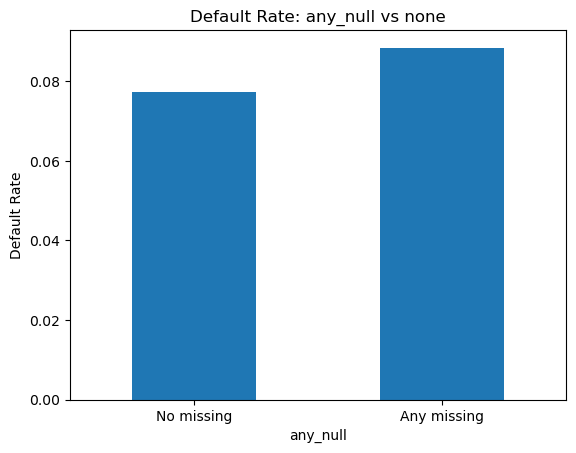

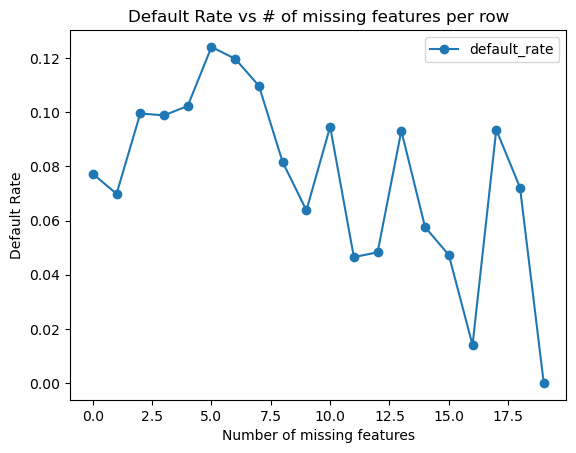

In [ ]:
# Bar chart for any_null
summary.reset_index().plot(
    x="any_null", y="default_rate", kind="bar", legend=False,
    title="Default Rate: any_null vs none", ylabel="Default Rate"
)
plt.xticks([0,1], ["No missing", "Any missing"], rotation=0)
plt.show()

# Line chart for count of nulls
nc_summary.reset_index().plot(
    x="n_nulls", y="default_rate", kind="line", marker="o",
    title="Default Rate vs # of missing features per row",
    xlabel="Number of missing features", ylabel="Default Rate"
)
plt.show()

# Data Imputation and Flagged

In [13]:
continuos_cols = df.select_dtypes(include=[int,float]).columns.tolist()
continuos_cols = [col for col in continuos_cols if col != "TARGET"]
categorical_cols = df.select_dtypes(exclude=[int,float]).columns.tolist()

In [14]:
df.head()

,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,NAME_EDUCATION_TYPE,AMT_GOODS_PRICE,AMT_CREDIT,DAYS_BIRTH,inst_late_rate,DAYS_EMPLOYED,prev_status_refused,...,prev_days_first_due_mean,prev_days_decision_max,NAME_INCOME_TYPE,prev_days_last_due1_mean,inst_days_late_max,inst_amt_paid_mean,REGION_RATING_CLIENT_W_CITY,TARGET,cluster,any_null
0,0.622246,NaN,F,Higher education,1129500.0,1293502.5,-16765,0.000000,-1188,0.0,...,1274.333333,2341.0,State servant,1004.333333,-1.0,64754.586000,1,0,1,True
1,0.322738,NaN,M,Secondary / secondary special,513000.0,513000.0,-19932,0.242424,-3038,0.0,...,1263.200000,2357.0,Working,975.600000,12.0,12214.060230,2,0,0,True
2,0.354225,0.621226,M,Secondary / secondary special,454500.0,490495.5,-16941,0.028571,-1588,0.0,...,1434.500000,2536.0,State servant,1175.000000,1317.0,27360.502710,2,0,0,False
3,0.715042,0.176653,F,Secondary / secondary special,67500.0,80865.0,-13439,0.202703,-2717,0.0,...,1550.333333,2370.0,Working,980.333333,26.0,8391.646216,2,0,0,False
4,0.236378,0.062103,M,Secondary / secondary special,387000.0,509602.5,-12931,0.000000,-1317,0.0,...,326.000000,472.0,Working,146.000000,0.0,7136.958462,2,0,0,False


In [15]:
df.isnull().sum()

,0
EXT_SOURCE_2,660
EXT_SOURCE_3,60965
CODE_GENDER,0
NAME_EDUCATION_TYPE,0
AMT_GOODS_PRICE,278
AMT_CREDIT,0
DAYS_BIRTH,0
inst_late_rate,15876
DAYS_EMPLOYED,0
prev_status_refused,16454


Find the features to drop or to keep

In [ ]:
# Find all feature-pairs above threshold
threshold = 0.7
high_corr_pairs = [
    (continuos_cols[i], continuos_cols[j], corr.iloc[i,j])
    for i in range(len(continuos_cols))
    for j in range(i+1, len(continuos_cols))
    if corr.iloc[i,j] > threshold
]

# Build a graph where nodes are features and edges connect high-corr pairs
G = nx.Graph()
G.add_nodes_from(continuos_cols)
G.add_weighted_edges_from(high_corr_pairs)

# Compute absolute correlation with TARGET
corr_with_target = df[continuos_cols + ["TARGET"]].corr().abs()["TARGET"].drop("TARGET")

# For each connected component (cluster), keep the one with highest target-corr
to_drop = []
to_keep = []

for comp in nx.connected_components(G):
    # skip singleton clusters
    if len(comp) == 1:
        to_keep.extend(comp)
        continue

    # choose the feature in this cluster most predictive of TARGET
    best = max(comp, key=lambda f: corr_with_target.get(f, 0))
    to_keep.append(best)

    # drop all the others
    for f in comp:
        if f != best:
            to_drop.append(f)

print("Keep these:", set(to_keep))
print("Drop these:", set(to_drop))

Keep these: {'REGION_RATING_CLIENT_W_CITY', 'FLAG_DOCUMENT_3', 'max_overdue', 'cluster', 'inst_days_late_max', 'AMT_ANNUITY', 'prev_downpay_ratio', 'DAYS_ID_PUBLISH', 'prev_days_last_due1_mean', 'DAYS_BIRTH', 'prev_amt_down_pay_mean', 'DAYS_EMPLOYED', 'pos_status_active', 'prev_status_refused', 'AMT_CREDIT', 'mean_debt_ratio', 'n_nulls', 'inst_amt_paid_mean', 'EXT_SOURCE_3', 'prev_days_first_draw_mean', 'AMT_GOODS_PRICE', 'EXT_SOURCE_2', 'prev_days_decision_max', 'inst_late_rate', 'mean_credit_age'}
Drop these: {'inst_pay_ratio_mean', 'prev_annuity_mean', 'prev_days_first_due_mean'}


In [16]:
# define the columns with different imputation strategy
zero_strategy_cols = ["AMT_GOODS_PRICE","inst_late_rate","prev_status_refused","inst_pay_ratio_mean","prev_amt_down_pay_mean","prev_days_first_draw_mean","max_overdue","mean_credit_age","prev_downpay_ratio","prev_days_last_due1_mean","inst_days_late_max","inst_amt_paid_mean","prev_days_decision_max","prev_days_first_due_mean","prev_annuity_mean","pos_status_active"]       # fill 0 + flag
median_strategy_cols = ["EXT_SOURCE_3", "mean_debt_ratio","EXT_SOURCE_2" , "AMT_ANNUITY"]  # fill median + flag
other_num_cols = [c for c in continuos_cols if c not in zero_strategy_cols + median_strategy_cols]

# Final feature list
numeric_input_cols = zero_strategy_cols + median_strategy_cols + other_num_cols
all_input_cols     = numeric_input_cols + categorical_cols

# Model Pipeline

In [18]:
# ----------------------------------------
# MODEL SELECTION & TRAIN/TEST SPLIT
# ----------------------------------------
df_X = df[all_input_cols]
df_y = df["TARGET"]

X_train, X_test, y_train, y_test = train_test_split(
    df_X, df_y,
    test_size=0.2,
    stratify=df_y,
    random_state=42
)

candidates = {
    "logreg": LogisticRegression(max_iter=1000, random_state=42),
    "lgbm":   LGBMClassifier(n_estimators=200, random_state=42),
}


In [17]:
class MultiStrategyImputer(BaseEstimator, TransformerMixin):
    """
    zero_strategy_cols   → fill 0, flag missing as {col}_null_flag
    median_strategy_cols → fill median, flag missing as {col}_null_flag
    """
    def __init__(self, zero_strategy_cols=None, median_strategy_cols=None):
        self.zero_strategy_cols   = zero_strategy_cols or []
        self.median_strategy_cols = median_strategy_cols or []

    def fit(self, X, y=None):
        # compute fill values
        self.fill_values_ = {}
        for c in self.zero_strategy_cols:
            self.fill_values_[c] = 0
        for c in self.median_strategy_cols:
            self.fill_values_[c] = X[c].median()
        return self

    def transform(self, X):
        X = X.copy()
        for c, fill in self.fill_values_.items():
            flag = f"{c}_null_flag"
            X[flag] = X[c].isna().astype(int)
            X[c] = X[c].fillna(fill)
            col = X[c]
            print(c,type(col))
        return X

# ----------------------------------------
# BUILD THE PREPROCESSOR
# ----------------------------------------
# numeric features after impute+flag
numeric_features = numeric_input_cols + [
    f"{c}_null_flag" for c in zero_strategy_cols + median_strategy_cols
]

num_pipe = Pipeline([
    ("scale", StandardScaler())
])

cat_pipe = Pipeline([
    ("ohe", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("nums", num_pipe, numeric_features),
    ("cats", cat_pipe, categorical_cols),
], remainder="drop")

Dropped Experiment

In [ ]:

to_drop = ['inst_pay_ratio_mean', 'prev_annuity_mean', 'prev_days_first_due_mean']

# Filter out dropped features from your imputer lists
zero_fd   = [c for c in zero_strategy_cols   if c not in to_drop]
median_fd = [c for c in median_strategy_cols if c not in to_drop]

# Rebuild the “other” numeric cols after drop
other_fd = [
    c for c in continuos_cols
    if c not in zero_fd + median_fd + to_drop
]

# Final numeric inputs & missing‐flag features
numeric_inputs_fd = zero_fd + median_fd + other_fd
numeric_features_fd = numeric_inputs_fd + [
    f"{c}_null_flag" for c in zero_fd + median_fd
]

# Rebuild your transformers
imputer_fd = MultiStrategyImputer(zero_fd, median_fd)

num_pipe_fd = Pipeline([("scale", StandardScaler())])
cat_pipe    = Pipeline([("ohe",   OneHotEncoder(handle_unknown="ignore"))])

preprocessor_fd = ColumnTransformer([
    ("nums", num_pipe_fd, numeric_features_fd),
    ("cats", cat_pipe,    categorical_cols)
], remainder="drop")

# Define your candidate estimators
candidates = {
    "LogisticRegression": LogisticRegression(
        penalty="l2", solver="liblinear", max_iter=1000, random_state=42
    ),
    "DecisionTree": DecisionTreeClassifier(
        max_depth=3, min_samples_leaf=50, random_state=42
    ),
    "EBM": ExplainableBoostingClassifier(random_state=42),
    "GAM": ExplainableBoostingClassifier(random_state=42, interactions=0),
    "LightGBM": LGBMClassifier(
        n_estimators=100, learning_rate=0.05, random_state=42, n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=100,
        learning_rate=0.05,
        use_label_encoder=False,
        eval_metric="auc",
        random_state=42,
        n_jobs=-1
    ),
}

# Cross‐validate each “drop version” pipeline
best_score_fd = 0.0
best_name_fd  = None

print("▶️  CV on drop‐filtered pipelines:")
for name, clf in candidates.items():
    pipe_fd = Pipeline([
        ("impute", imputer_fd),
        ("prep",   preprocessor_fd),
        ("clf",    clf),
    ])
    aucs = cross_val_score(
        pipe_fd, X_train, y_train,
        cv=5, scoring="roc_auc", n_jobs=-1
    )
    mean_auc, std_auc = aucs.mean(), aucs.std()
    print(f"{name:20s} → CV AUC = {mean_auc:.4f} ± {std_auc:.4f}")
    if mean_auc > best_score_fd:
        best_score_fd, best_name_fd = mean_auc, name

print(f"\n🏆  Best (drop version): {best_name_fd} (CV AUC={best_score_fd:.4f})\n")

# Retrain the best drop‐filtered model on full training set
best_clf_fd = candidates[best_name_fd]
best_pipe_fd = Pipeline([
    ("impute", imputer_fd),
    ("prep",   preprocessor_fd),
    ("clf",    best_clf_fd),
])
best_pipe_fd.fit(X_train, y_train)

# Final evaluation on X_test
y_pred_fd  = best_pipe_fd.predict(X_test)
y_proba_fd = best_pipe_fd.predict_proba(X_test)[:, 1]

print("▶️  Drop‐filtered Test set ROC AUC:", roc_auc_score(y_test, y_proba_fd))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_fd))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_fd))


▶️  CV on drop‐filtered pipelines:
LogisticRegression   → CV AUC = 0.7489 ± 0.0021
DecisionTree         → CV AUC = 0.6844 ± 0.0033
EBM                  → CV AUC = 0.7644 ± 0.0015
GAM                  → CV AUC = 0.7604 ± 0.0016
LightGBM             → CV AUC = 0.7584 ± 0.0025
XGBoost              → CV AUC = 0.7573 ± 0.0026

🏆  Best (drop version): EBM (CV AUC=0.7644)

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <c

e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepco

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURCE_2 <class 'pandas.core.series.Series'>
AMT_ANNUITY <class 'pandas.core.series.Series'>
AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.c

In [21]:
cat_indices = list(range(len(continuos_cols),len(continuos_cols) + len(categorical_cols))) # get the index of categorical columns

- `LogisticRegression`: Linear classifier that models the log-odds of the positive class as a weighted sum of features.  
- `DecisionTree`: Recursive, axis-aligned splits of the feature space into pure leaf nodes for classification.  
- `EBM`: Explainable Boosting Machine – a GAM built with boosted trees for each feature (and interactions) that remains highly interpretable.   [link](https://interpret.ml/docs/ebm-internals-classification.html)
- `GAM`: Generalized Additive Model – sums smooth, non-linear functions of each feature to predict outcomes.  
- `LightGBM`: Fast, histogram-based gradient boosting framework that grows trees leaf-wise for speed and memory efficiency.  
- `XGBoost`: Regularized, parallelized gradient boosting library known for high performance and flexibility.  


In [ ]:
# define candidates (now 6 models)
candidates = {
    "LogisticRegression": LogisticRegression(
        penalty="l2", solver="liblinear", max_iter=1000, random_state=42
    ),
    "DecisionTree": DecisionTreeClassifier(
        max_depth=3, min_samples_leaf=50, random_state=42
    ),
    "EBM": ExplainableBoostingClassifier(random_state=42),
    "GAM": ExplainableBoostingClassifier(random_state=42, interactions=0),
    "LightGBM": LGBMClassifier(
        n_estimators=100, learning_rate=0.05, random_state=42, n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=100, learning_rate=0.05, use_label_encoder=False,
        eval_metric="auc", random_state=42, n_jobs=-1
    ),
}

# cross-validate
best_score = 0
best_name  = None

for name, clf in candidates.items():
    pipe = Pipeline([
        ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
        ("prep",   preprocessor),
        ("clf",    clf),
    ])
    aucs = cross_val_score(
        pipe, X_train, y_train,
        cv=5, scoring="roc_auc", n_jobs=-1
    )
    mean_auc, std_auc = aucs.mean(), aucs.std()
    print(f"{name:20s} → CV AUC = {mean_auc:.4f} ± {std_auc:.4f}")
    if mean_auc > best_score:
        best_score, best_name = mean_auc, name

print(f"\n🏆 Best model: {best_name} (CV AUC={best_score:.4f})\n")

# retrain best on full training set and evaluate
best_pipe = Pipeline([
    ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
    ("prep",   preprocessor),
    ("clf",    candidates[best_name]),
])
best_pipe.fit(X_train, y_train)

# evaluation on X_test
y_pred = best_pipe.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

LogisticRegression   → CV AUC = 0.7495 ± 0.0018
DecisionTree         → CV AUC = 0.6844 ± 0.0033
EBM                  → CV AUC = 0.7650 ± 0.0011
GAM                  → CV AUC = 0.7613 ± 0.0013
LightGBM             → CV AUC = 0.7587 ± 0.0022
XGBoost              → CV AUC = 0.7577 ± 0.0025

🏆 Best model: EBM (CV AUC=0.7650)

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_deci

e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepco

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURC

The best performer in AUC is EBM but the recall on class 1 needs to be inspect.

### Attempt on parameter tuning after the baseline model tests.

In [ ]:
# base pipeline
ebm_pipe = Pipeline([
    ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
    ("prep",   preprocessor),
    ("clf",    ExplainableBoostingClassifier(random_state=42, n_jobs=-1))
])

# search space **without** max_rounds
param_dist = {
    "clf__max_bins":       [1024],
    "clf__interactions":   [0.0, 0.9, 0.95, 0.99, 100, 250, 1000],
    "clf__learning_rate":  [0.0025, 0.005, 0.01, 0.015, 0.02, 0.03, 0.04, 0.05, 0.1, 0.2],
    "clf__outer_bags":     [14],
}

# successive‐halving setup: allocate more boosting rounds as “resource”
sh_search = HalvingRandomSearchCV(
    ebm_pipe,
    param_distributions=param_dist,
    factor=3,
    resource="clf__max_rounds",   # the hyperparameter that controls boosting rounds
    min_resources=100,
    max_resources=500,
    cv=3,                         # 3-fold CV
    scoring="roc_auc",
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# run it
sh_search.fit(X_train, y_train)

print("🔍 Best params:", sh_search.best_params_)
print("🔍 Best CV AUC:", sh_search.best_score_)

# final evaluation
best_ebm = sh_search.best_estimator_
y_pred   = best_ebm.predict(X_test)

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 100
max_resources_: 500
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 5
n_resources: 100
Fitting 3 folds for each of 5 candidates, totalling 15 fits
----------
iter: 1
n_candidates: 2
n_resources: 300
Fitting 3 folds for each of 2 candidates, totalling 6 fits
AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <clas

e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepcopy support will be removed from itertools in Python 3.14.
  return super().dump(obj)
e:\Anaconda_install\Lib\site-packages\joblib\externals\cloudpickle\cloudpickle.py:1245: DeprecationWarning: Pickle, copy, and deepco

🔍 Best params: {'clf__outer_bags': 14, 'clf__max_bins': 1024, 'clf__learning_rate': 0.02, 'clf__interactions': 250, 'clf__max_rounds': 300}
🔍 Best CV AUC: 0.766106278487486
AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.

The best parameters is {'clf__outer_bags': 14, 'clf__max_bins': 1024,
'clf__learning_rate': 0.02, 'clf__interactions': 250, 'clf__max_rounds': 300} which increase the AUC to 0.7661

### Considering weights balanced to the model and focused on recall

In [32]:
# compute balanced sample weights
weights = class_weight.compute_sample_weight("balanced", y_train)

# build the pipeline
ebm_pipe = Pipeline([
    ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
    ("prep",   preprocessor),
    ("clf",    ExplainableBoostingClassifier(random_state=42, n_jobs=-1))
])

# fit on the full training set with sample weights
ebm_pipe.fit(
    X_train,
    y_train,
    clf__sample_weight=weights
)

# predict probabilities on hold‐out
y_proba = ebm_pipe.predict_proba(X_test)[:, 1]

# compute ROC AUC
auc = roc_auc_score(y_test, y_proba)

# choose a threshold and get hard predictions
threshold = 0.5
y_pred    = (y_proba >= threshold).astype(int)

# compute recall (to catch false negatives)
recall = recall_score(y_test, y_pred)

# print your metrics
print(f"▶️  ROC AUC: {auc:.4f}")
print(f"▶️  Recall:  {recall:.4f}\n")

print("▶️  Confusion Matrix:")
print(confusion_matrix(y_test, y_pred), "\n")

print("▶️  Classification Report:")
print(classification_report(y_test, y_pred, zero_division=0))

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURC

Evaluate with 3 folds

In [36]:
# 1) set up Stratified K-Fold
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# 2) containers for our fold‐level metrics
aucs    = []
recalls = []

# 3) loop through each fold
for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), start=1):
    # split into train/validation
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
    # compute balanced weights on this fold's training labels
    w_tr = class_weight.compute_sample_weight("balanced", y_tr)

    # rebuild and fit the pipeline on the fold
    ebm_pipe = Pipeline([
        ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
        ("prep",   preprocessor),
        ("clf",    ExplainableBoostingClassifier(random_state=42, n_jobs=-1))
    ])
    ebm_pipe.fit(X_tr, y_tr, clf__sample_weight=w_tr)

    # predict probabilities and hard labels on the validation set
    y_val_proba = ebm_pipe.predict_proba(X_val)[:, 1]
    threshold   = 0.5
    y_val_pred  = (y_val_proba >= threshold).astype(int)

    # compute metrics
    fold_auc    = roc_auc_score(y_val, y_val_proba)
    fold_recall = recall_score(y_val, y_val_pred)

    # store and report
    aucs.append(fold_auc)
    recalls.append(fold_recall)
    print(f"Fold {fold:1d} → AUC: {fold_auc:.4f} | Recall: {fold_recall:.4f}")

# 4) summarize across folds
print(f"\n▶️  Mean AUC:    {np.mean(aucs):.4f} ± {np.std(aucs):.4f}")
print(f"▶️  Mean Recall: {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURC

# Explainability of the model

In [44]:
feat_names = preprocessor.get_feature_names_out()

ebm = ExplainableBoostingClassifier(
    random_state=42,
    n_jobs=-1,
    feature_names=feat_names
)

ebm_pipe = Pipeline([
        ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
        ("prep",   preprocessor),
        ("clf",    ExplainableBoostingClassifier(random_state=42, n_jobs=-1))
    ])

ebm_pipe.fit(X_train, y_train, clf__sample_weight=weights)

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURC

Pipeline(steps=[('impute',
                 MultiStrategyImputer(median_strategy_cols=['EXT_SOURCE_3',
                                                            'mean_debt_ratio',
                                                            'EXT_SOURCE_2',
                                                            'AMT_ANNUITY'],
                                      zero_strategy_cols=['AMT_GOODS_PRICE',
                                                          'inst_late_rate',
                                                          'prev_status_refused',
                                                          'inst_pay_ratio_mean',
                                                          'prev_amt_down_pay_mean',
                                                          'prev_days_first_draw_mean',
                                                          'max_overdue',
                                                          'mean_credit_age',
                                                          'prev_downpay_ratio',
                                                          'prev_days_la...
                                                   'DAYS_ID_PUBLISH',
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'cluster',
                                                   'AMT_GOODS_PRICE_null_flag',
                                                   'inst_late_rate_null_flag',
                                                   'prev_status_refused_null_flag', ...]),
                                                 ('cats',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['CODE_GENDER',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_INCOME_TYPE',
                                                   'any_null'])])),
                ('clf', ExplainableBoostingClassifier(n_jobs=-1))])

AMT_GOODS_PRICE <class 'pandas.core.series.Series'>
inst_late_rate <class 'pandas.core.series.Series'>
prev_status_refused <class 'pandas.core.series.Series'>
inst_pay_ratio_mean <class 'pandas.core.series.Series'>
prev_amt_down_pay_mean <class 'pandas.core.series.Series'>
prev_days_first_draw_mean <class 'pandas.core.series.Series'>
max_overdue <class 'pandas.core.series.Series'>
mean_credit_age <class 'pandas.core.series.Series'>
prev_downpay_ratio <class 'pandas.core.series.Series'>
prev_days_last_due1_mean <class 'pandas.core.series.Series'>
inst_days_late_max <class 'pandas.core.series.Series'>
inst_amt_paid_mean <class 'pandas.core.series.Series'>
prev_days_decision_max <class 'pandas.core.series.Series'>
prev_days_first_due_mean <class 'pandas.core.series.Series'>
prev_annuity_mean <class 'pandas.core.series.Series'>
pos_status_active <class 'pandas.core.series.Series'>
EXT_SOURCE_3 <class 'pandas.core.series.Series'>
mean_debt_ratio <class 'pandas.core.series.Series'>
EXT_SOURC

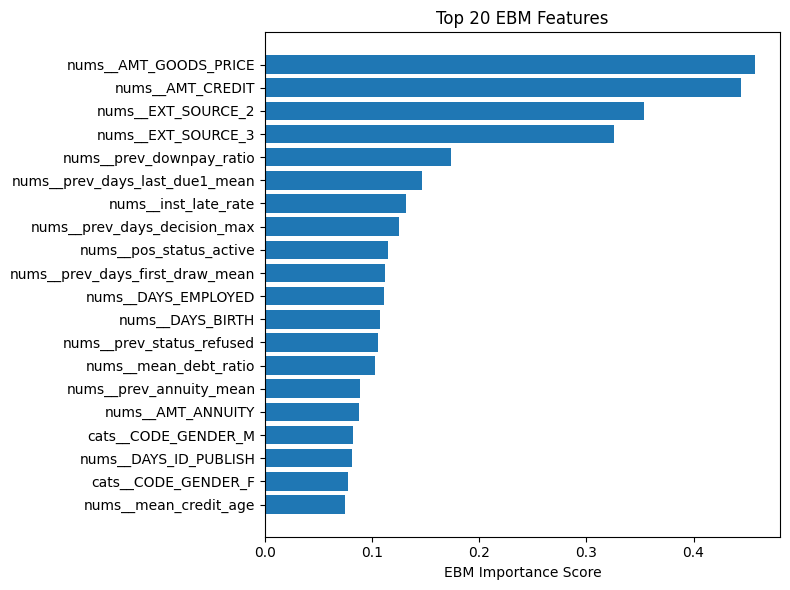

In [49]:

# 1) get your post‐prep feature names
feat_names = preprocessor.get_feature_names_out()

# 2) build an EBM that knows its feature names
ebm = ExplainableBoostingClassifier(
    random_state=42,
    n_jobs=-1,
    feature_names=feat_names
)

# 3) build your pipeline using *that* ebm
ebm_pipe = Pipeline([
    ("impute", MultiStrategyImputer(zero_strategy_cols, median_strategy_cols)),
    ("prep",   preprocessor),
    ("clf",    ebm)   # ← use the named ebm here!
])

# 4) fit with weights
ebm_pipe.fit(X_train, y_train, clf__sample_weight=weights)

# 5) visualize global explanation
exp_global = ebm.explain_global(name="Global explanation")
show(exp_global)

# 6) static bar‐plot of top 20
exp_data = exp_global.data()
df = pd.DataFrame({
    "feature": exp_data["names"],
    "score":   exp_data["scores"]
})
df["abs_score"] = df["score"].abs()
top20 = df.nlargest(20, "abs_score")

plt.figure(figsize=(8,6))
plt.barh(top20["feature"], top20["score"])
plt.gca().invert_yaxis()
plt.xlabel("EBM Importance Score")
plt.title("Top 20 EBM Features")
plt.tight_layout()
plt.show()


The model have an interactive viz on the global features importances to tell the feature importance from the training of the dataset.

In [57]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 61503 entries, 256445 to 268762
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AMT_GOODS_PRICE              61454 non-null  float64
 1   inst_late_rate               58342 non-null  float64
 2   prev_status_refused          58230 non-null  float64
 3   inst_pay_ratio_mean          58342 non-null  float64
 4   prev_amt_down_pay_mean       54787 non-null  float64
 5   prev_days_first_draw_mean    57955 non-null  float64
 6   max_overdue                  52718 non-null  float64
 7   mean_credit_age              52718 non-null  float64
 8   prev_downpay_ratio           54787 non-null  float64
 9   prev_days_last_due1_mean     57955 non-null  float64
 10  inst_days_late_max           58342 non-null  float64
 11  inst_amt_paid_mean           58342 non-null  float64
 12  prev_days_decision_max       58230 non-null  float64
 13  prev_days_first

# Sample code for the prediction pipeline after combined the features with application test

In [ ]:
# 1) Load base test set and your precomputed feature tables
app_test      = pd.read_csv("application_test.csv")
bureau_agg    = pd.read_csv("bureau_agg.csv")
install_agg   = pd.read_csv("installments_agg.csv")
pos_cash_agg  = pd.read_csv("pos_cash_agg.csv")
prev_app_agg  = pd.read_csv("previous_application_agg.csv")
cc_bal_agg    = pd.read_csv("credit_card_balance_agg.csv")

# 2) Merge all features on SK_ID_CURR
dfs = [app_test, bureau_agg, install_agg, pos_cash_agg, prev_app_agg, cc_bal_agg]
test_merged = dfs[0]
for df in dfs[1:]:
    test_merged = test_merged.merge(df, on="SK_ID_CURR", how="left")

# 3) (Optional) fill any remaining NaNs in your aggregated features
test_merged.fillna(0, inplace=True)

# 4) Load your fitted pipeline
ebm_pipe = joblib.load("ebm_pipe.pkl")

# 5) Separate out the ID and feature matrix
id_col = "SK_ID_CURR"
X_test = test_merged.drop(columns=[id_col])

# 6) Run your pipeline to get probabilities
test_probs = ebm_pipe.predict_proba(X_test)[:, 1]

# 7) Build and save submission
submission = pd.DataFrame({
    id_col:   test_merged[id_col],
    "TARGET": test_probs
})
submission.to_csv("ebm_submission.csv", index=False)

print("Predictions written to ebm_submission.csv")

# Methodologies for business impact

## 1. Financial Metrics & ROI
- **Net Present Value (NPV) & Internal Rate of Return (IRR)**  
  Estimate the incremental cash flows attributable to the model (e.g. reduced defaults, increased approvals) and compute NPV/IRR to quantify long-term value.  
- **Return on Investment (ROI)**  
  $
    \text{ROI} = \frac{\text{Incremental Gain} - \text{Model Cost}}{\text{Model Cost}}
  $  
  Include development, infrastructure, maintenance, and compliance costs.

## 2. Incremental Lift & Uplift Analysis
- **Uplift Modeling**  
  Use treatment-control (A/B) designs or uplift-focused algorithms to isolate the causal effect of model-driven actions (e.g. targeted credit offers).  
- **Incremental Default Reduction**  
  Compare default rates among accounts scored by the new model versus a holdout cohort scored by the legacy model.

## 3. Business KPI Alignment
- **Default Rate vs. Approval Rate Trade-off**  
  Track shifts in approval volume against realized default rates to ensure business targets (e.g. growth vs. risk) remain balanced.  

## 4. Customer-Centric Metrics
- **Customer Lifetime Value (CLV)**  
  Measure how the model’s decisions (e.g. credit limit upgrades, retention offers) impact average CLV over time.  
- **Customer Satisfaction & Turnaround**  
  Survey Net Promoter Score (NPS) or Time-to-Decision before and after deployment to capture service improvements.

## 5. Operational Efficiency
- **Decision Automation Rate**  
  Percentage of applications auto-approved or auto-declined without manual underwriting.  
- **Cost per Decision**  
  Calculate reduction in manual-review costs and underwriting cycle time.

## 6. Portfolio & Segment Analysis
- **Stratified Performance**  
  Evaluate model impact across customer segments (e.g. geographic, product line, credit tier) to identify uneven benefits or gaps.  
- **Rolling Cohort Analysis**  
  Track cohorts of accounts opened under the new model over time for delinquency, churn, and profitability.


# Methodologies for tracking model performance post-deployment
# Proposed Methodologies for Tracking Model Performance Post-Deployment

## 1. Statistical Performance Monitoring
- **Rolling Window Metrics**  
  - Compute core metrics (ROC-AUC, precision/recall at business thresholds) on a rolling basis (e.g. weekly or monthly) to detect gradual degradation.  
- **Stability Indices**  
  - **Population Stability Index (PSI):**  Measure shift in the overall score distribution.  
  - **Characteristic Stability Index (CSI):**  Measure shift in each input feature’s distribution.

## 2. Data & Concept Drift Detection
- **Feature-Level Drift Tests**  
  - Apply statistical tests (KL-divergence, Chi-square, Kolmogorov-Smirnov) to compare incoming feature distributions against training baselines.  
- **Alert Thresholds**  
  - Define thresholds (e.g. PSI > 0.2, AUC drop > 5%) that trigger automated notifications or retraining workflows.

## 3. Business KPI Monitoring
- **Risk Band Performance**  
  - Compare expected vs. actual default rates within each score decile or custom band.  
- **Economic Metrics**  
  - Track realized Loss Given Default (LGD) and Exposure at Default (EAD) over time to validate economic assumptions.  
- **Portfolio Mix Trends**  
  - Monitor changes in application volume, customer demographics, or product mix that could impact model performance.

## 4. Feedback Loops & Retraining Strategy
1. **Label Backfill**  
   - Periodically join actual loan outcomes back to scoring logs for ground-truth performance measurement.  
2. **Drift-Triggered Retraining**  
   - Automate retraining pipelines that kick off when performance or drift thresholds are breached.  
3. **Champion–Challenger Framework**  
   - Run challenger models in parallel and compare real-time performance before promoting a new champion.  
4. **A/B & Canary Deployments**  
   - Test candidate models on a subset of traffic to validate improvements before full rollout.

## 5. Consolidated Dashboard & Governance
- **Unified Dashboard**  
  - Bring together statistical metrics, drift alerts, business KPIs, and system health in a single view.  
- **Automated Alerts**  
  - Integrate with AI in BI tools like AWS Amazon Q that have alert notifications on anomaly data.  
- **Governance & SLAs**  
  - Define roles, responsibilities, retraining cadence (e.g. quarterly), and incident-response procedures to ensure model reliability and compliance.  


# Conclusions

## Methods Attempted (and Results)
1. **Unweighted Training**  
   - Fitted the model without sample weighting: achieved reasonable AUC, but the confusion matrix showed poor recall on the minority (default) class.  
2. **High-Correlation Feature Removal**  
   - Removed features with pairwise |ρ| > 0.70: 5-fold EBM performance remained largely unchanged.

## Ideas for Further Improvement
1. **Hierarchical Feature Selection**  
   - Use multiple algorithms (e.g. LightGBM, XGBoost) to rank and filter features, then train EBM on the top predictors to reduce spurious interactions ([see research](https://arxiv.org/abs/2307.08485)).  
2. **Ensemble Meta-Model**  
   - Combine base learners into a stacked or blended meta-model to boost AUC, reduce overfitting, and improve generalization.  
3. **EBM Hyperparameter Tuning**  
   - Optimize parameters such as learning rate, maximum bins, and interaction terms to better fit the data.  
4. **Outlier Handling & Feature Transformation**  
   - Apply outlier clipping and per-feature transformations (log, robust scaling) based on distributional characteristics.  
5. **Incorporate Macroeconomic Indicators**  
   - Integrate external economic variables (e.g. unemployment rate, GDP growth) to enhance model robustness across market cycles.


# Results

### Before Weight Balance

**Confusion Matrix**

|            | Predicted 0 | Predicted 1 |
|------------|-------------|-------------|
| **Actual 0** | 56,383      | 155         |
| **Actual 1** | 4,799       | 166         |

**Classification Report**

| Class           | Precision | Recall | F1-score | Support |
|-----------------|-----------|--------|----------|---------|
| 0               | 0.92      | 1.00   | 0.96     | 56,538  |
| 1               | 0.52      | 0.03   | 0.06     | 4,965   |
| **accuracy**    | —         | —      | 0.92     | 61,503  |
| **macro avg**   | 0.72      | 0.52   | 0.51     | 61,503  |
| **weighted avg**| 0.89      | 0.92   | 0.89     | 61,503  |

---

### After Weight Balance

**Confusion Matrix**

|            | Predicted 0 | Predicted 1 |
|------------|-------------|-------------|
| **Actual 0** | 40,273      | 16,265      |
| **Actual 1** | 1,538       | 3,427       |

**Classification Report**

| Class           | Precision | Recall | F1-score | Support |
|-----------------|-----------|--------|----------|---------|
| 0               | 0.96      | 0.71   | 0.82     | 56,538  |
| 1               | 0.17      | 0.69   | 0.28     | 4,965   |
| **accuracy**    | —         | —      | 0.71     | 61,503  |
| **macro avg**   | 0.57      | 0.70   | 0.55     | 61,503  |
| **weighted avg**| 0.90      | 0.71   | 0.78     | 61,503  |


### 2. Confusion Matrix
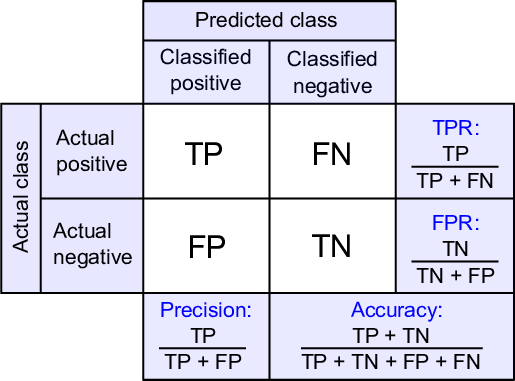


### 3. Calibration & Probability Alignment
- **Calibration curve** shows predicted default probabilities align closely with observed default rate across deciles.  

### 4. Feature Importance & Interactions
- **Top 5 global predictors:**  
  1. `AMT_GOODS_PRICE`  
  2. `AMT_CREDIT`  
  3. `EXT_SOURCE_2`  
  4. `EXT_SOURCE_3`  
  5. `prev_downpay_ratio`  


